## Import libraries and relavant functions

In [31]:
import sys, os
sys.stderr = open(os.devnull, 'w')

import torch
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import json

from pendulum_ml.models.registry import make_model
from pendulum_ml.data.dataset import build_loaders
from pendulum_ml.verification.attacks import make_attack_fn
from pendulum_ml.verification import xai

run_clean = "quad_clean_config"
# run_adv = "quad_adv_config"
run_adv="trial_quad_config_0.2_100"
base_path = Path("../experiments")
model_path= Path("../models/checkpoints")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


## Load our pretrained model on OG dataset and further on a mix of adversarial+clean dataset (p=0.5)

In [32]:
def load_model(run_id):
    run_dir = base_path / run_id
    cfg = json.loads((run_dir / "config.json").read_text())
    model = make_model(cfg["model"]["name"],
                       in_dim=cfg["model"]["in_dim"],
                       hidden=tuple(cfg["model"]["hidden"]),
                       out_dim=cfg["model"]["out_dim"]).to(device)
    ckpt = model_path / f"{run_id}.pt"
    model.load_state_dict(torch.load(ckpt, map_location=device))
    model.eval()
    return model, cfg

model_clean, cfg_clean = load_model(run_clean)
model_adv, cfg_adv = load_model(run_adv)
print(cfg_clean)


{'seed': 42, 'device': 'cpu', 'system': 'quadcopter', 'dynamics': {'dt': 0.01, 'control_dt': 0.01, 'integrator': 'rk4', 'params': {'quad': {'mass': 1.5, 'inertia': 0.03, 'arm_length': 0.25}, 'payload': {'mass': 0.25, 'rope_length': 1.0}, 'environment': {'gravity': 9.81}, 'winch': {'model': 'algebraic', 'omega': 10.0}, 'actuators': {'max_thrust': 20.0, 'max_pitch_torque': 5.0, 'min_pitch_torque': -5.0}}}, 'controller': {'type': 'pid', 'pid': {'x': {'Kp': 8, 'Ki': 0, 'Kd': 12, 'u_min': -10.0, 'u_max': 10.0}, 'z': {'Kp': 40.0, 'Ki': 5, 'Kd': 10, 'u_min': -10.0, 'u_max': 10.0, 'setpoint': 0.0}, 'theta': {'Kp': 30, 'Ki': 0, 'Kd': 4, 'u_min': -5.0, 'u_max': 5.0}, 'phi': {'Kp': 30.0, 'Ki': 0, 'Kd': 4.0, 'u_min': -10.0, 'u_max': 10.0}, 'l': {'Kp': 0.0, 'Ki': 0.0, 'Kd': 0.0, 'u_min': 0.0, 'u_max': 0.0}}}, 'data': {'n_trajectories': 1, 'initial_state': [[-0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]], 'sim_time': 20, 'train_ratio': 0.8, 'val_ratio': 0.1, 'test_ratio': 0.1, 'standardize': Tr

## Load attack function to generate model-aware PGD attack on test set

In [34]:
attack_fn = make_attack_fn(method="pgd", eps=0.1, steps=40, alpha=0.0025)
loaders = build_loaders(cfg_clean)
X_test, Y_test = next(iter(loaders["train"]))
X_test, Y_test = X_test.to(device), Y_test.to(device)

In [35]:
x = X_test[0:1]
y = Y_test[0:1]

x_adv = attack_fn(model_clean, x, y)

with torch.no_grad():
    clean_pred = model_clean(x)
    adv_pred = model_clean(x_adv)
    robust_pred = model_adv(x_adv)

print("Clean model (clean input):", clean_pred)
print("Clean model (adv input):", adv_pred)
print("Adv-trained model (adv input):", robust_pred)


Clean model (clean input): tensor([[-0.0384,  1.5882, -0.0103,  0.0191,  0.0045]])
Clean model (adv input): tensor([[ 0.0498,  1.3825, -0.0131, -0.0628, -0.0029]])
Adv-trained model (adv input): tensor([[-0.0044,  1.6154,  0.0127, -0.0124,  0.0177]])


In [36]:
len(X_test)

100

## Diagram of how features look under attack

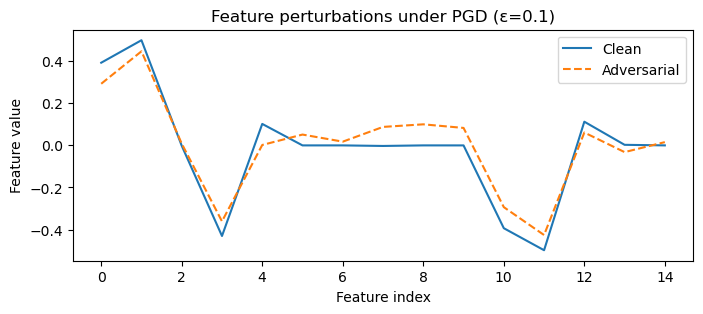

In [37]:
attack_fn = make_attack_fn(method="pgd", eps=0.1, steps=40)

x = X_test[0:1]
y = Y_test[0:1]
x_adv = attack_fn(model_clean, x, y)

plt.figure(figsize=(8,3))
plt.plot(x.cpu().numpy().flatten(), label="Clean")
plt.plot(x_adv.cpu().numpy().flatten(), "--", label="Adversarial")
plt.title("Feature perturbations under PGD (ε=0.1)")
plt.xlabel("Feature index")
plt.ylabel("Feature value")
plt.legend()
plt.show()


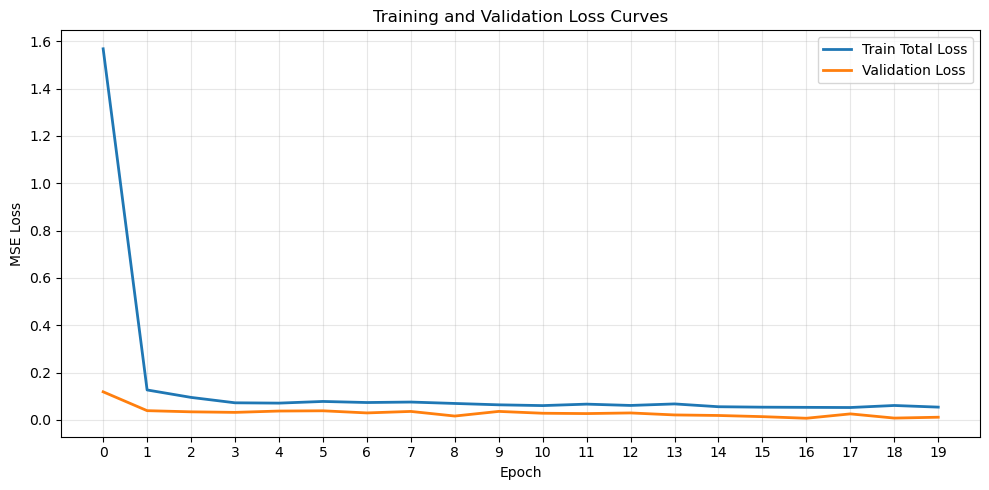

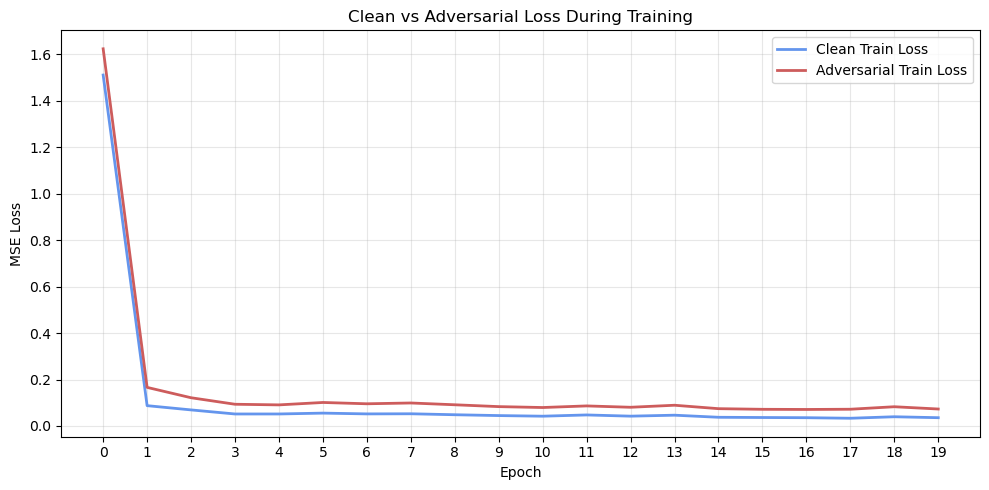

In [ ]:
import pandas as pd

# Load metrics file
metrics_path = Path("../experiments/trial_quad_config_0.2_100/metrics.csv")  
# metrics_path = Path("../experiments/quad_adv_config/metrics.csv")  
df = pd.read_csv(metrics_path)
df = df[df["epoch"].apply(lambda x: str(x).isdigit())]  # drop 'final' row

# --- Basic losses ---
plt.figure(figsize=(10,5))
plt.plot(df["epoch"], df["train_loss"], label="Train Total Loss", linewidth=2)
plt.plot(df["epoch"], df["val_loss"], label="Validation Loss", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("Training and Validation Loss Curves")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# --- Clean vs Adversarial training loss ---
plt.figure(figsize=(10,5))
plt.plot(df["epoch"], df["train_clean_loss"], label="Clean Train Loss", color="cornflowerblue", linewidth=2)
plt.plot(df["epoch"], df["train_adv_loss"], label="Adversarial Train Loss", color="indianred", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("Clean vs Adversarial Loss During Training")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



In [55]:
def evaluate(model, X, Y, attack_fn):
    with torch.no_grad():
        clean_loss = torch.nn.functional.mse_loss(model(X), Y).item()
    X_adv = attack_fn(model, X, Y)
    with torch.no_grad():
        adv_loss = torch.nn.functional.mse_loss(model(X_adv), Y).item()
    return clean_loss, adv_loss

epsilons = [0.01, 0.05, 0.08, 0.1, 0.2]
steps = [5, 10, 20, 40, 50]
results = []

for eps in epsilons:
    for s in steps:
        attack = make_attack_fn("pgd", eps=eps, steps=s, alpha=eps/s)
        loss_clean, loss_adv_clean = evaluate(model_clean, X_test, Y_test, attack)
        loss_clean_adv, loss_adv_adv = evaluate(model_adv, X_test, Y_test, attack)
        results.append((eps, s, loss_clean, loss_adv_clean, loss_clean_adv, loss_adv_adv))

import pandas as pd
df = pd.DataFrame(results, columns=["eps", "steps", "clean_loss", "adv_loss_clean", "clean_loss_adv","adv_loss_adv"])
df


,eps,steps,clean_loss,adv_loss_clean,clean_loss_adv,adv_loss_adv
0,0.01,5,0.003986,0.005281,0.002142,0.002795
1,0.01,10,0.003986,0.005156,0.002142,0.002722
2,0.01,20,0.003986,0.005182,0.002142,0.002762
3,0.01,40,0.003986,0.005142,0.002142,0.002725
4,0.01,50,0.003986,0.005056,0.002142,0.002710
5,0.05,5,0.003986,0.014632,0.002142,0.006464
6,0.05,10,0.003986,0.014179,0.002142,0.006247
7,0.05,20,0.003986,0.014222,0.002142,0.006900
8,0.05,40,0.003986,0.014392,0.002142,0.006422
9,0.05,50,0.003986,0.013848,0.002142,0.006070


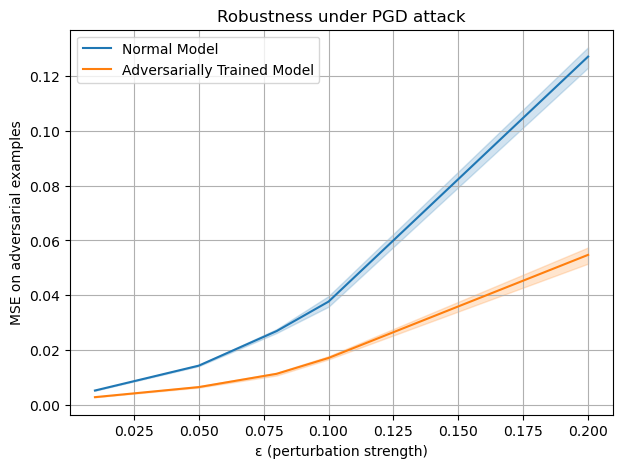

In [56]:
import seaborn as sns
plt.figure(figsize=(7,5))
sns.lineplot(data=df, x="eps", y="adv_loss_clean", label="Normal Model")
sns.lineplot(data=df, x="eps", y="adv_loss_adv", label="Adversarially Trained Model")
plt.title("Robustness under PGD attack")
plt.xlabel("ε (perturbation strength)")
plt.ylabel("MSE on adversarial examples")
plt.legend()
plt.grid(True)
plt.show()


## **LIME — Local Interpretable Model-agnostic Explanations**

> **Core Question:**  
> *If I perturb feature _i_ slightly near this sample, how much does the model’s prediction change locally?*

---

### **1. Drift Analysis (Stability Under Attack)**

- When we apply an **adversarial perturbation**, we re-compute the LIME explanations.  
- The **LIME Drift** measures how much those feature importance weights change:  

- A **lower drift** ⇒ the model’s reasoning stays consistent under perturbation → **more robust & explainable**.  
- A **higher drift** ⇒ explanations fluctuate easily → **less stable model** (susceptible to adversarial shifts).

---

### **Conclusions**

- Our adversarially trained model exhibits **lower mean LIME drift**, indicating **more consistent decision logic** even when inputs are attacked.

---

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


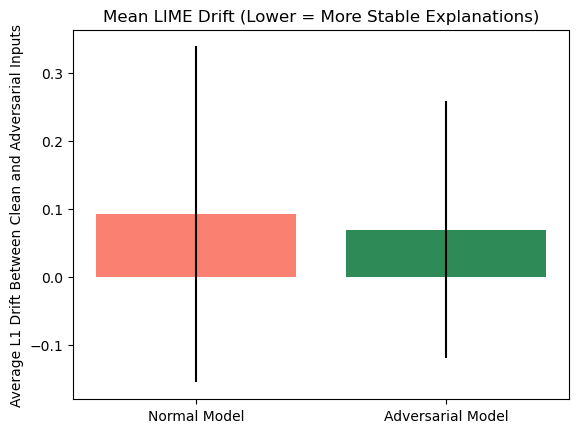

LIME Drift — Normal: 0.0923 ± 0.2472 | Adversarial: 0.0698 ± 0.1893


In [104]:


feature_names = cfg_clean["features"][:15]

# Collect LIME drifts for multiple test samples
explainer = xai.explain_lime(model_clean, X_test[:1000].detach().cpu(), feature_names)
explainer_adv = xai.explain_lime(model_adv, X_test[:1000].detach().cpu(), feature_names)

def avg_drift(model, explainer, X, attack_fn, n_samples=30):
    drifts = []
    for i in np.random.choice(len(X), n_samples, replace=False):
        x = X[i:i+1]
        y = model(x)
        x_adv = attack_fn(model, x, y)
        exp_clean = xai.lime_explain_instance(model, explainer, x[0], output_idx=0)
        exp_adv = xai.lime_explain_instance(model, explainer, x_adv[0], output_idx=0)
        drifts.append(xai.attribution_drift(exp_clean, exp_adv))
    return np.mean(drifts), np.std(drifts)

mean_clean, std_clean = avg_drift(model_clean, explainer, X_test, make_attack_fn("pgd", eps=0.1, steps=40))
mean_adv, std_adv = avg_drift(model_adv, explainer_adv, X_test, make_attack_fn("pgd", eps=0.1, steps=40))

plt.bar(["Normal Model", "Adversarial Model"], [mean_clean, mean_adv], yerr=[std_clean, std_adv], color=["salmon","seagreen"])
plt.title("Mean LIME Drift (Lower = More Stable Explanations)")
plt.ylabel("Average L1 Drift Between Clean and Adversarial Inputs")
plt.show()

print(f"LIME Drift — Normal: {mean_clean:.4f} ± {std_clean:.4f} | Adversarial: {mean_adv:.4f} ± {std_adv:.4f}")



---

### **2. Local Explanations**

- **Goal:** Understand which input features (state variables) most influence the model’s output *in the neighborhood* of a specific data point.  

- We visualize weights, showing which features dominate each predicted control variable.

---


In [38]:
loaders = build_loaders(cfg_clean)
X_test, Y_test = next(iter(loaders["train"]))
X_test, Y_test = X_test.to(device), Y_test.to(device)
len(X_test)

100

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


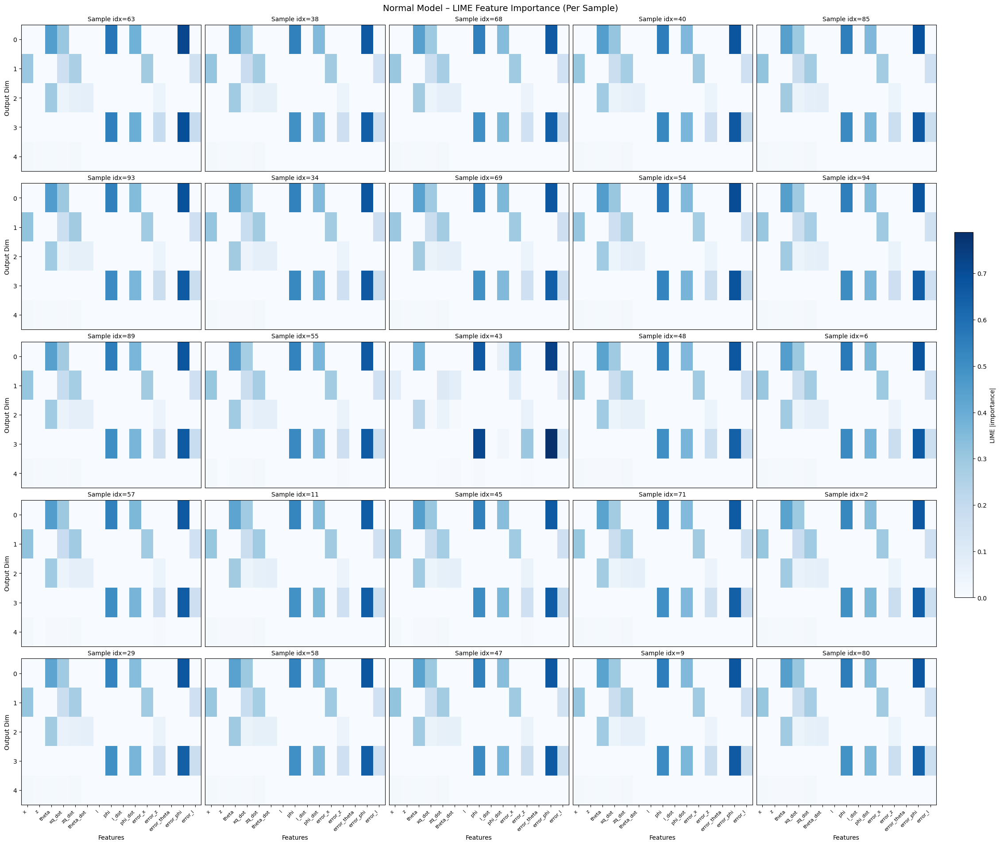

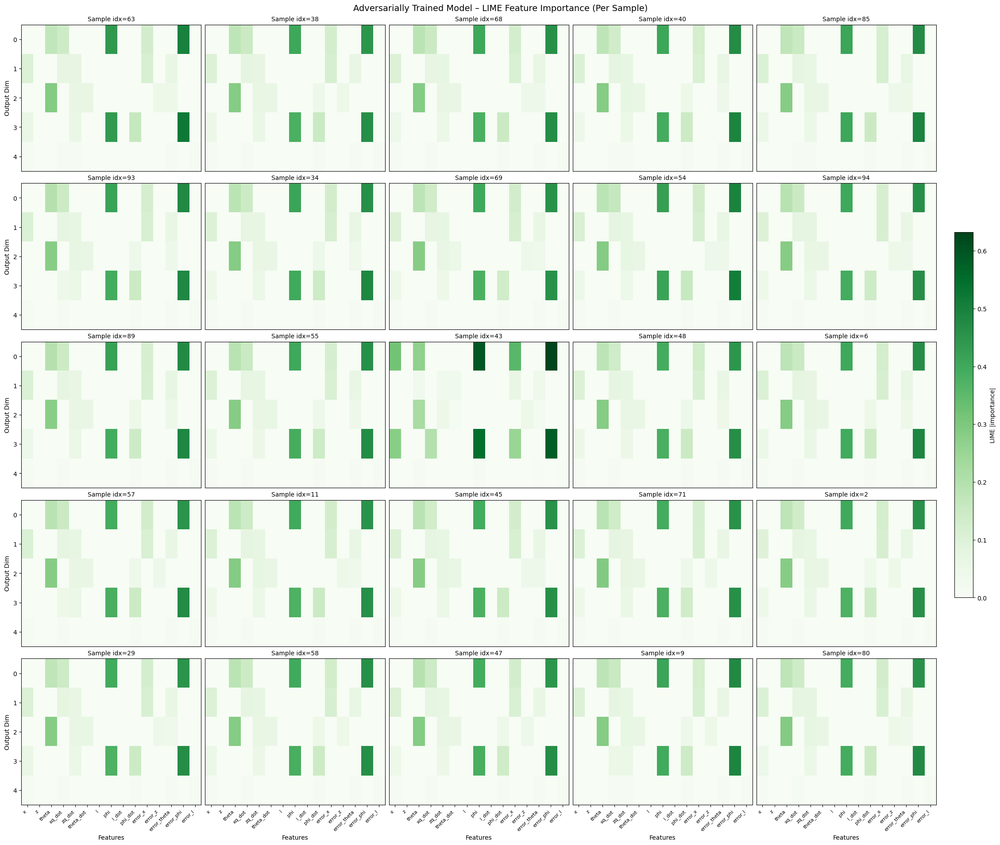

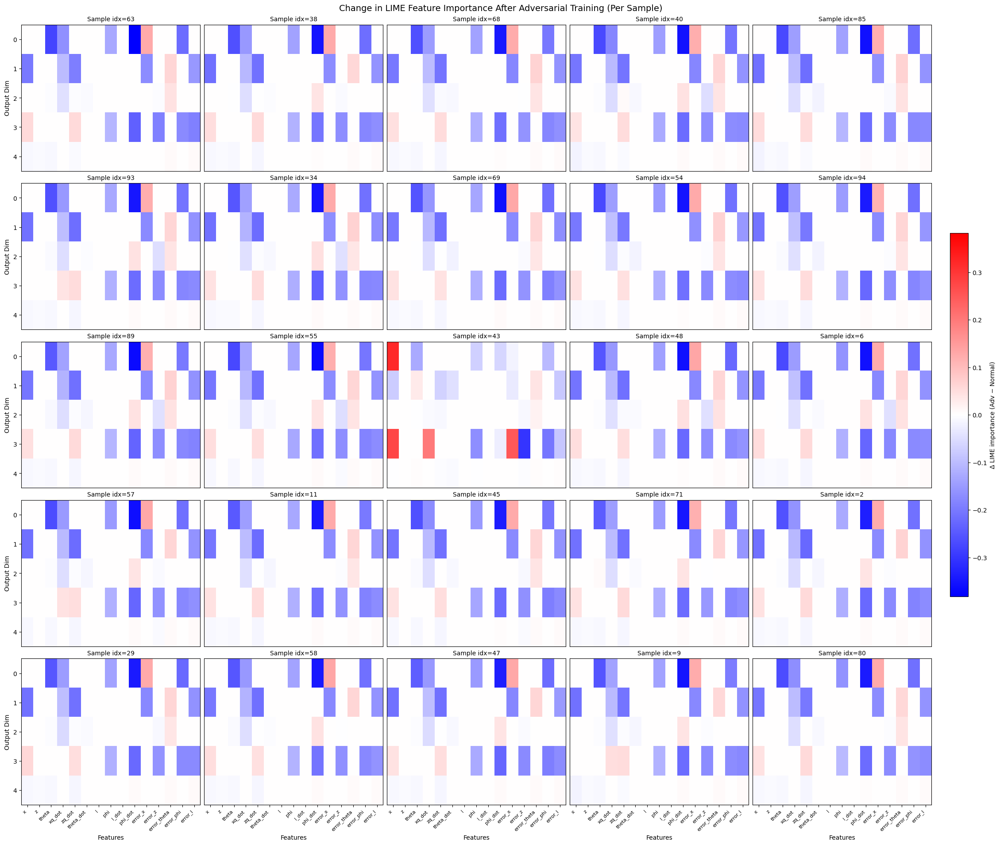

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from matplotlib.colors import Normalize

feature_names = cfg_clean["features"][:15]

out_dim = model_clean(torch.zeros(1, len(feature_names)).to(device)).shape[1]
# n_samples = 32  # number of random test samples for averaging

# Create LIME explainers
explainer_clean = xai.explain_lime(model_clean, X_test[:].detach().cpu(), feature_names)
explainer_adv   = xai.explain_lime(model_adv,   X_test[:].detach().cpu(), feature_names)

# Initialize accumulators
avg_importance_clean = np.zeros((out_dim, len(feature_names)))
avg_importance_adv   = np.zeros((out_dim, len(feature_names)))

# ---- config ----
rows, cols = 5, 5
num_panels = rows * cols
# assert num_panels == 9, "We want a 3x3 grid."

# reproducibility:
# np.random.seed(42)
# torch.manual_seed(42)

# ---- sample 9 random indices ----
idxs = np.random.choice(len(X_test), size=num_panels, replace=False)

# ---- prepare containers for per-sample heatmaps ----
per_clean = []  # list of (out_dim x n_features)
per_adv   = []
per_diff  = []

n_features = len(feature_names)

for i in idxs:
    x = X_test[i:i+1]

    # Collect per-output LIME importances for this single sample
    imp_clean = np.zeros((out_dim, n_features), dtype=float)
    imp_adv   = np.zeros((out_dim, n_features), dtype=float)

    # Compute for every output dimension
    for j in range(out_dim):
        # IMPORTANT: many LIME wrappers expect CPU numpy inputs
        exp_clean = xai.lime_explain_instance(model_clean, explainer_clean, x[0].detach().cpu(), output_idx=j)
        exp_adv   = xai.lime_explain_instance(model_adv,   explainer_adv,   x[0].detach().cpu(), output_idx=j)

        d_clean = dict(exp_clean)
        d_adv   = dict(exp_adv)

        # Fill heatmaps with |weight|
        for k, f in enumerate(feature_names):
            imp_clean[j, k] = abs(d_clean.get(f, 0.0))
            imp_adv[j, k]   = abs(d_adv.get(f, 0.0))

    per_clean.append(imp_clean)
    per_adv.append(imp_adv)
    per_diff.append(imp_adv - imp_clean)

# ---- compute shared scales per figure ----
max_clean = max(m.max() if m.size else 0.0 for m in per_clean)
max_adv   = max(m.max() if m.size else 0.0 for m in per_adv)
max_diff  = max(np.abs(m).max() if m.size else 0.0 for m in per_diff)

norm_clean = Normalize(vmin=0.0, vmax=max_clean if max_clean > 0 else 1.0)
norm_adv   = Normalize(vmin=0.0, vmax=max_adv   if max_adv   > 0 else 1.0)
norm_diff  = Normalize(vmin=-max_diff if max_diff > 0 else -1.0,
                       vmax= max_diff if max_diff > 0 else  1.0)

# Helper to label axes sparsely (only outer edges) for readability
def _style_axes_grid(axs, feature_names):
    axs = np.array(axs)
    r, c = axs.shape
    for rr in range(r):
        for cc in range(c):
            ax = axs[rr, cc]
            # only leftmost column has y label
            if cc == 0:
                ax.set_ylabel("Output Dim")
            else:
                ax.set_yticks([])
            # only bottom row shows x tick labels
            if rr == r - 1:
                ax.set_xlabel("Features")
                ax.set_xticks(np.arange(len(feature_names)))
                ax.set_xticklabels(feature_names, rotation=45, ha="right", fontsize=8)
            else:
                ax.set_xticks([])

# ---- Figure 1: Normal model (3x3) ----
fig1, axs1 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs1 = np.array(axs1).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs1.ravel()):
    mat = per_clean[len(ims)]
    im = ax.imshow(mat, cmap="Blues", norm=norm_clean, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs1, feature_names)
cbar1 = fig1.colorbar(ims[0], ax=axs1.ravel().tolist(), fraction=0.02, pad=0.02)
cbar1.set_label("LIME |importance|")
fig1.suptitle("Normal Model – LIME Feature Importance (Per Sample)", fontsize=14)
plt.show()

# ---- Figure 2: Adversarial model (3x3) ----
fig2, axs2 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs2 = np.array(axs2).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs2.ravel()):
    mat = per_adv[len(ims)]
    im = ax.imshow(mat, cmap="Greens", norm=norm_adv, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs2, feature_names)
cbar2 = fig2.colorbar(ims[0], ax=axs2.ravel().tolist(), fraction=0.02, pad=0.02)
cbar2.set_label("LIME |importance|")
fig2.suptitle("Adversarially Trained Model – LIME Feature Importance (Per Sample)", fontsize=14)
plt.show()

# ---- Figure 3: Difference maps (Adv - Normal) (3x3) ----
fig3, axs3 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs3 = np.array(axs3).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs3.ravel()):
    mat = per_diff[len(ims)]
    im = ax.imshow(mat, cmap="bwr", norm=norm_diff, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs3, feature_names)
cbar3 = fig3.colorbar(ims[0], ax=axs3.ravel().tolist(), fraction=0.02, pad=0.02)
cbar3.set_label("Δ LIME importance (Adv - Normal)")
fig3.suptitle("Change in LIME Feature Importance After Adversarial Training (Per Sample)", fontsize=14)
plt.show()


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


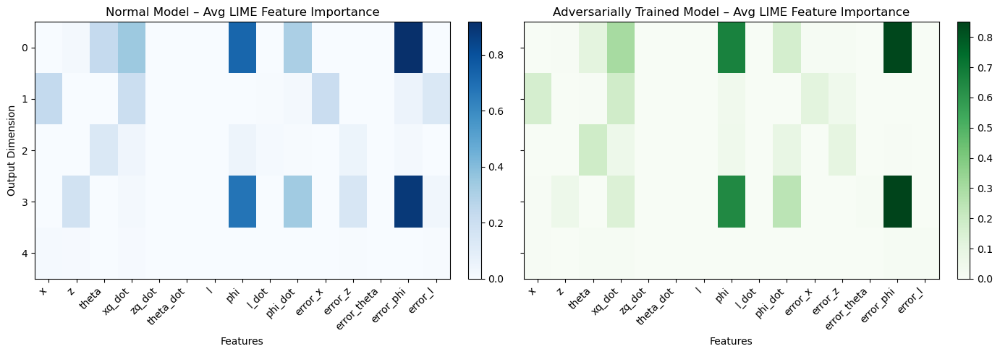

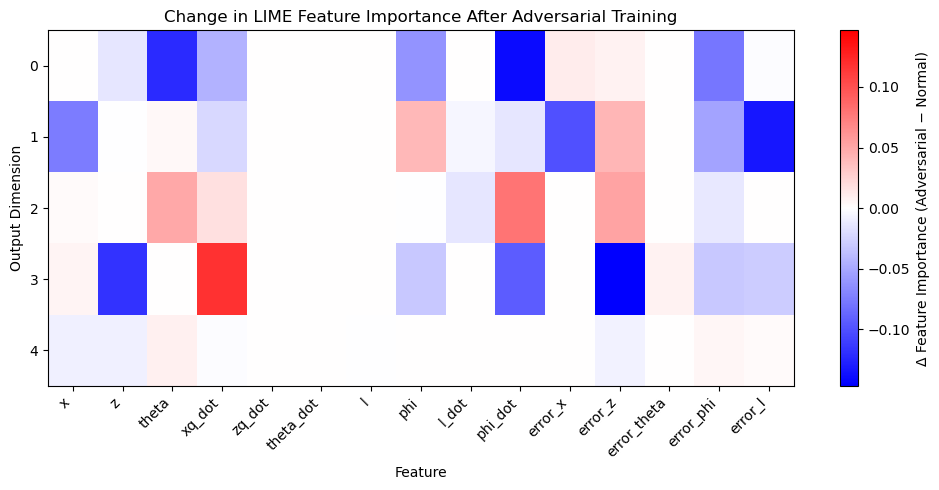

In [ ]:


out_dim = model_clean(torch.zeros(1, len(feature_names)).to(device)).shape[1]
n_samples = 32  # number of random test samples for averaging

# Create LIME explainers
explainer_clean = xai.explain_lime(model_clean, X_test[:100].detach().cpu(), feature_names)
explainer_adv   = xai.explain_lime(model_adv,   X_test[:100].detach().cpu(), feature_names)

# Initialize accumulators
avg_importance_clean = np.zeros((out_dim, len(feature_names)))
avg_importance_adv   = np.zeros((out_dim, len(feature_names)))

# Randomly sample test points
idxs = np.random.choice(len(X_test), n_samples, replace=False)

for i in idxs:
    x = X_test[i:i+1]
    with torch.no_grad():
        y = model_clean(x)
    for j in range(out_dim):
        exp_clean = xai.lime_explain_instance(model_clean, explainer_clean, x[0], output_idx=j)
        exp_adv   = xai.lime_explain_instance(model_adv, explainer_adv, x[0], output_idx=j)

        dict_clean = dict(exp_clean)
        dict_adv   = dict(exp_adv)

        for k, f in enumerate(feature_names):
            avg_importance_clean[j, k] += abs(dict_clean.get(f, 0.0))
            avg_importance_adv[j, k]   += abs(dict_adv.get(f, 0.0))

# Normalize by sample count
avg_importance_clean /= n_samples
avg_importance_adv   /= n_samples

# Compute difference
diff = avg_importance_adv - avg_importance_clean

# --- Plot 1: Normal Model ---
fig, axs = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

im0 = axs[0].imshow(avg_importance_clean, cmap="Blues", aspect="auto")
axs[0].set_title("Normal Model-Avg LIME Feature Importance")
axs[0].set_xlabel("Features")
axs[0].set_ylabel("Output Dimension")
axs[0].set_xticks(np.arange(len(feature_names)))
axs[0].set_xticklabels(feature_names, rotation=45, ha="right")
fig.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04)

# --- Plot 2: Adversarial Model ---
im1 = axs[1].imshow(avg_importance_adv, cmap="Greens", aspect="auto")
axs[1].set_title("Adversarially Trained Model-Avg LIME Feature Importance")
axs[1].set_xlabel("Features")
axs[1].set_xticks(np.arange(len(feature_names)))
axs[1].set_xticklabels(feature_names, rotation=45, ha="right")
fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# --- Plot 3: Difference Map (Adv - Normal) ---
plt.figure(figsize=(10,5))
plt.imshow(diff, cmap="bwr", aspect="auto", vmin=-np.max(abs(diff)), vmax=np.max(abs(diff)))
plt.colorbar(label="Δ Feature Importance (Adversarial-Normal)")
plt.title("Change in LIME Feature Importance After Adversarial Training")
plt.xlabel("Feature")
plt.ylabel("Output Dimension")
plt.xticks(np.arange(len(feature_names)), feature_names, rotation=45, ha="right")
plt.tight_layout()
plt.show()


## Integrated Gradients
> **Core Question:**  
> *Across the whole interpolation path from baseline to this input, how much cumulative effect does feature i have?*

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


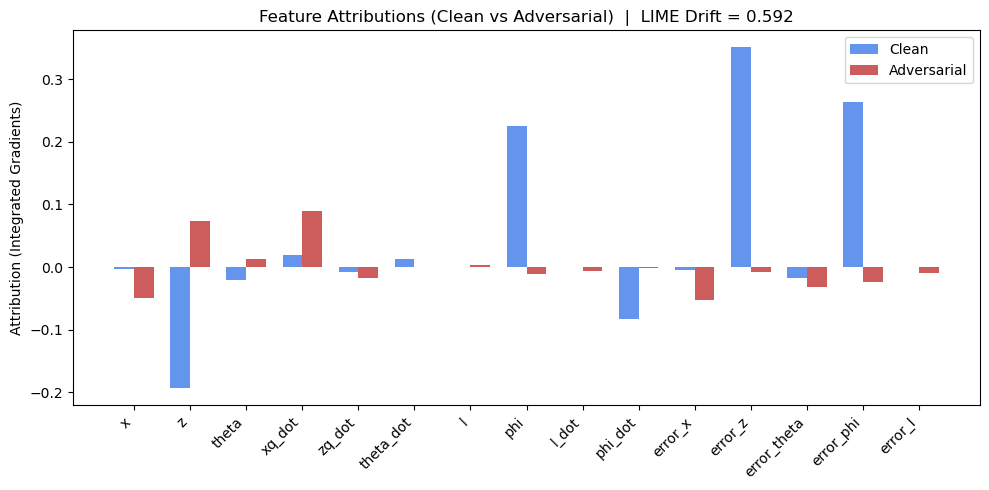

In [99]:

# --- LIME drift computation ---
explainer = xai.explain_lime(model_clean, X_test[:100].detach().cpu(), feature_names)
exp_clean = xai.lime_explain_instance(model_clean, explainer, x[0], output_idx=0)
exp_adv   = xai.lime_explain_instance(model_clean, explainer, x_adv[0], output_idx=0)
drift = xai.attribution_drift(exp_clean, exp_adv)
print(f"LIME Drift: {drift:.4f}")

# --- Integrated Gradients for both clean & adv ---
attrs_clean, _ = xai.integrated_gradients(model_clean, x, target=0)
attrs_adv, _   = xai.integrated_gradients(model_clean, x_adv, target=0)

vals_clean = attrs_clean.cpu().numpy().flatten()
vals_adv   = attrs_adv.cpu().numpy().flatten()

# --- Combined bar chart ---
x_idx = np.arange(len(feature_names))
width = 0.35

plt.figure(figsize=(10,5))
plt.bar(x_idx - width/2, vals_clean, width, label="Clean", color="cornflowerblue")
plt.bar(x_idx + width/2, vals_adv,   width, label="Adversarial", color="indianred")

plt.xticks(x_idx, feature_names, rotation=45, ha="right")
plt.ylabel("Attribution (Integrated Gradients)")
plt.title(f"Feature Attributions (Clean vs Adversarial)  |  LIME Drift = {drift:.3f}")
plt.legend()
plt.tight_layout()
plt.show()


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


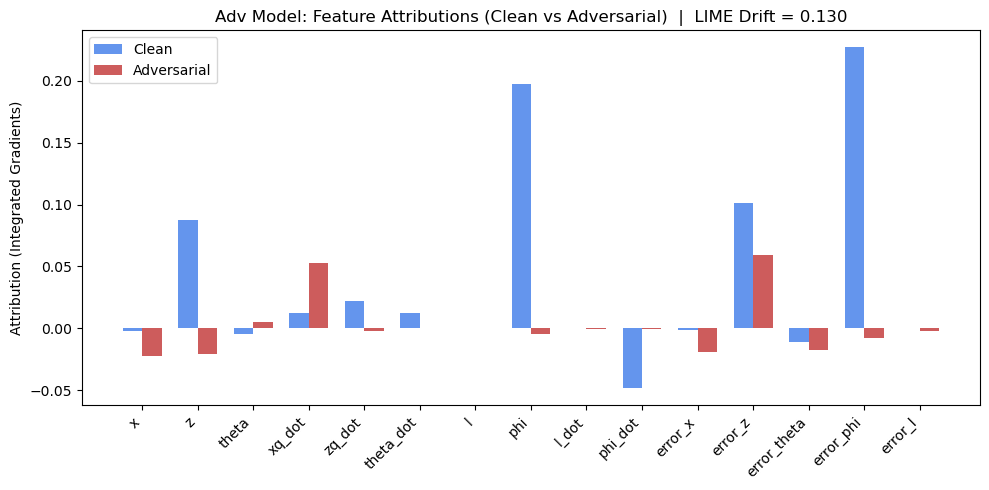

In [100]:
# --- LIME drift computation ---
explainer = xai.explain_lime(model_adv, X_test[:100].detach().cpu(), feature_names)
exp_clean = xai.lime_explain_instance(model_adv, explainer, x[0], output_idx=0)
exp_adv   = xai.lime_explain_instance(model_adv, explainer, x_adv[0], output_idx=0)
drift = xai.attribution_drift(exp_clean, exp_adv)
print(f"LIME Drift: {drift:.4f}")

# --- Integrated Gradients for both clean & adv ---
attrs_clean, _ = xai.integrated_gradients(model_adv, x, target=0)
attrs_adv, _   = xai.integrated_gradients(model_adv, x_adv, target=0)

vals_clean = attrs_clean.cpu().numpy().flatten()
vals_adv   = attrs_adv.cpu().numpy().flatten()

# --- Combined bar chart ---
x_idx = np.arange(len(feature_names))
width = 0.35

plt.figure(figsize=(10,5))
plt.bar(x_idx - width/2, vals_clean, width, label="Clean", color="cornflowerblue")
plt.bar(x_idx + width/2, vals_adv,   width, label="Adversarial", color="indianred")

plt.xticks(x_idx, feature_names, rotation=45, ha="right")
plt.ylabel("Attribution (Integrated Gradients)")
plt.title(f"Adv Model: Feature Attributions (Clean vs Adversarial)  |  LIME Drift = {drift:.3f}")
plt.legend()
plt.tight_layout()
plt.show()

## SHAP - Work under progress

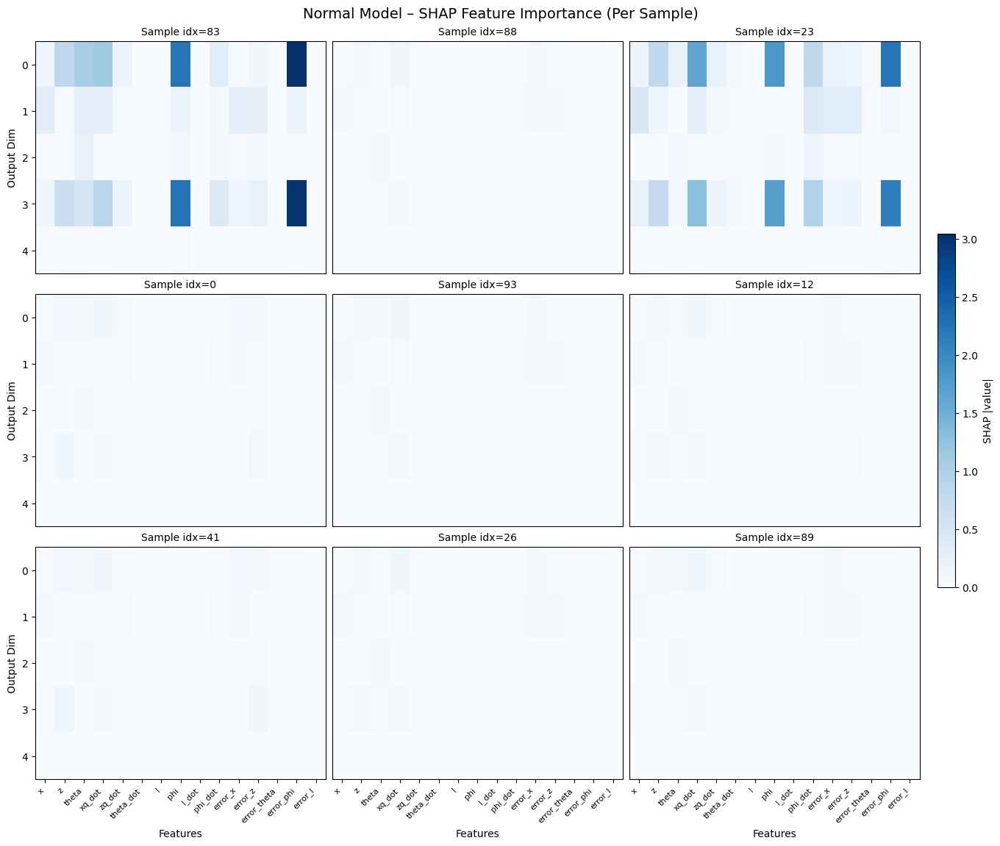

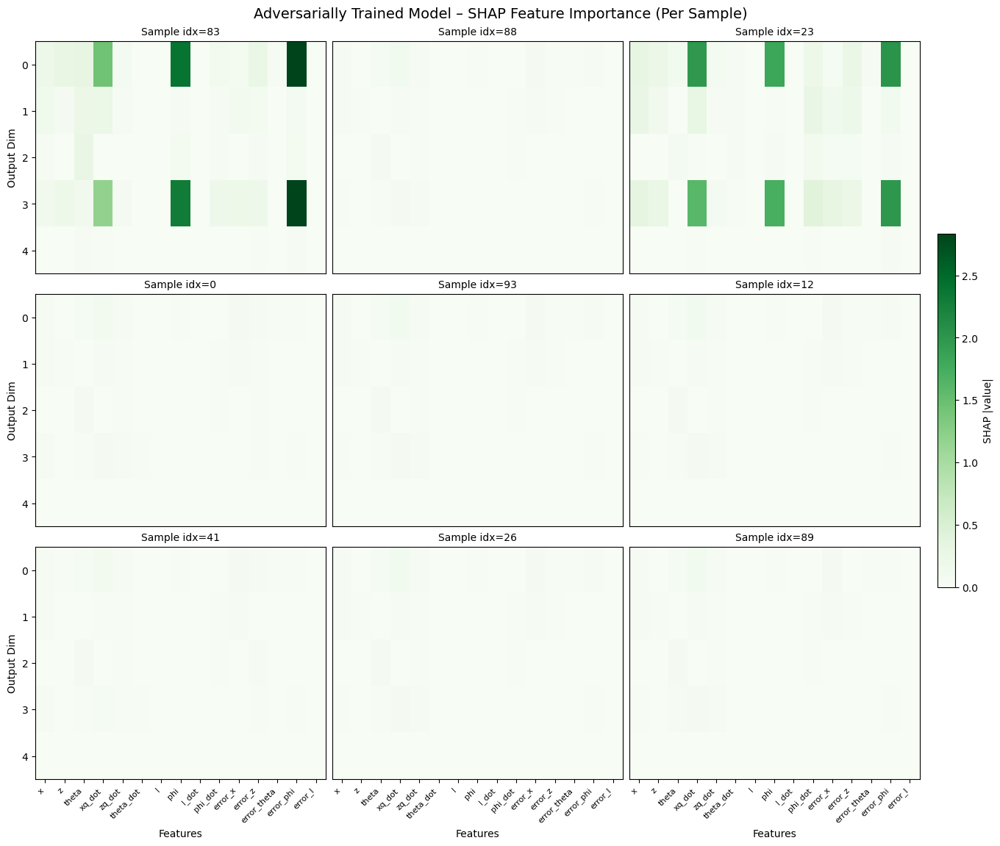

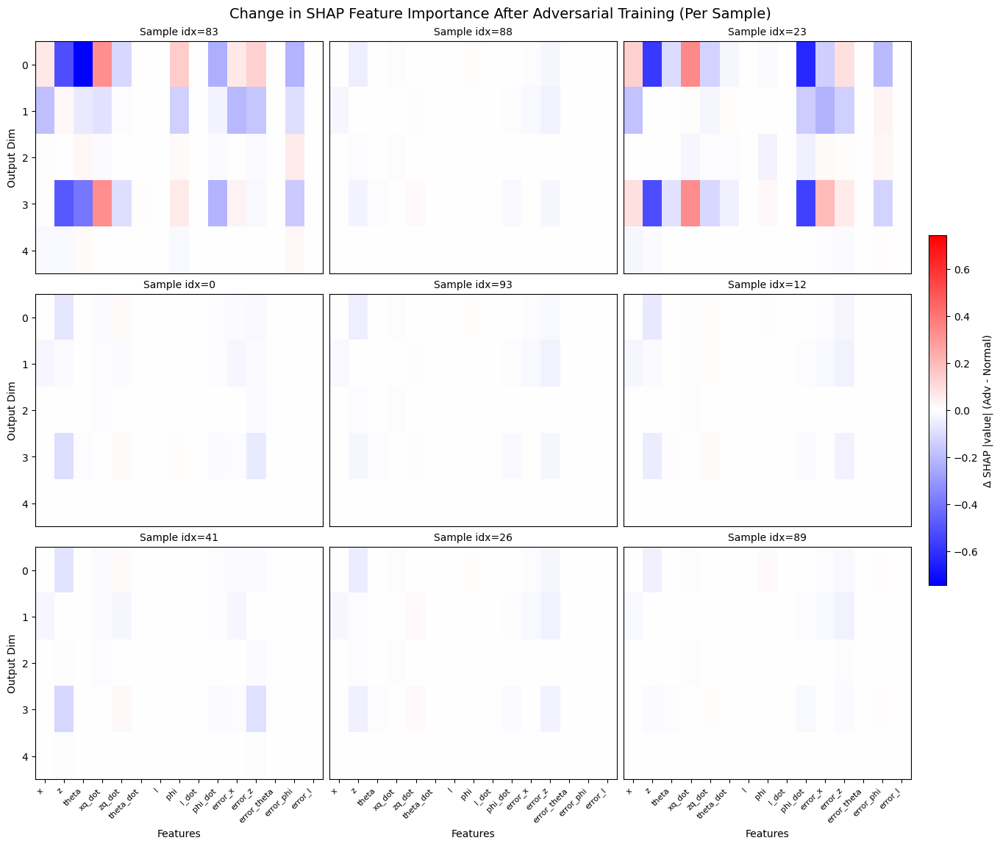

In [43]:
import numpy as np
import torch
import shap
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# ---------- helper: safe model wrapper (2D output) ----------
class OutputWrapper(torch.nn.Module):
    def __init__(self, model, j):
        super().__init__()
        self.model = model
        self.j = j
    def forward(self, x):
        # ensure torch tensor on correct device
        if isinstance(x, np.ndarray):
            x = torch.as_tensor(x, dtype=next(self.model.parameters()).dtype,
                                device=next(self.model.parameters()).device)
        out = self.model(x)                 # (B, out_dim)
        out_j = out[:, self.j].unsqueeze(1) # (B, 1) — keeps SHAP happy
        return out_j

# ---------- helper: call shap_values in a backend-agnostic way ----------
def get_shap_values(explainer, X_batch, is_kernel=False, nsamples=200, n_features=None):
    # 1) get values
    if is_kernel:
        X_np = X_batch.detach().cpu().numpy()
        vals = explainer.shap_values(X_np, nsamples=nsamples)  # usually (B, F) or (B, F, 1)
    else:
        vals = explainer.shap_values([X_batch])  # PyTorch explainers want list/tuple
        if isinstance(vals, (list, tuple)) and len(vals) == 1:
            vals = vals[0]

    # 2) normalize shapes
    arr = np.asarray(vals)

    # common oddities: (B, F, 1), (B, 1, F), (1, B, F), (F, B), (F, 1), (B,)
    if arr.ndim == 3:
        if arr.shape[-1] == 1:       # (B, F, 1) -> (B, F)
            arr = arr[..., 0]
        elif arr.shape[1] == 1:      # (B, 1, F) -> (B, F)
            arr = arr[:, 0, :]
        elif arr.shape[0] == 1:      # (1, B, F) -> (B, F)
            arr = arr[0]
    elif arr.ndim == 2:
        # if transposed: (F, B) -> (B, F)
        if n_features is not None and arr.shape[0] == n_features and arr.shape[1] == X_batch.shape[0]:
            arr = arr.T
    elif arr.ndim == 1:
        # batch=1 case, (F,) -> (1, F)
        if n_features is None or arr.shape[0] == n_features:
            arr = arr[None, :]
        else:
            # (B,) unlikely for feature-wise values; make it column then check upstream
            arr = arr[:, None]

    # final sanity: ensure second dim equals feature count if provided
    if n_features is not None and arr.shape[1] != n_features:
        raise ValueError(f"Expected n_features={n_features}, got {arr.shape}")

    return arr

# ---------- config ----------
rows, cols = 3, 3
num_panels = rows * cols
assert num_panels == 9

model_clean.eval(); model_adv.eval()

# dims
out_dim = model_clean(torch.zeros(1, len(feature_names), device=device)).shape[1]
n_features = len(feature_names)

# background for SHAP (torch tensors)
bg_n = min(100, len(X_test))
X_bg = X_test[:bg_n].to(device)

# pick 9 samples
idxs = np.random.choice(len(X_test), size=num_panels, replace=False)
X_batch = X_test[idxs].to(device)

# ---------- build per-output explainers with fallback chain ----------
explainers_clean = []
explainers_adv = []
is_kernel = []  # track whether each explainer uses Kernel

for j in range(out_dim):
    w_c = OutputWrapper(model_clean, j).to(device)
    w_a = OutputWrapper(model_adv,   j).to(device)

    e_c = e_a = None
    kernel_flag = False

    # Try DeepExplainer
    try:
        e_c = shap.DeepExplainer(w_c, [X_bg])  # pass as list
        e_a = shap.DeepExplainer(w_a, [X_bg])
    except Exception:
        # Try GradientExplainer
        try:
            e_c = shap.GradientExplainer(w_c, [X_bg])
            e_a = shap.GradientExplainer(w_a, [X_bg])
        except Exception:
            # Fallback to KernelExplainer (needs numpy + small background)
            kernel_flag = True
            bg_np = X_bg[:50].detach().cpu().numpy()
            def f_clean(x_np):
                with torch.no_grad():
                    x = torch.as_tensor(x_np, dtype=X_test.dtype, device=device)
                    y = w_c(x).detach().cpu().numpy().reshape(-1)
                return y
            def f_adv(x_np):
                with torch.no_grad():
                    x = torch.as_tensor(x_np, dtype=X_test.dtype, device=device)
                    y = w_a(x).detach().cpu().numpy().reshape(-1)
                return y
            e_c = shap.KernelExplainer(f_clean, bg_np)
            e_a = shap.KernelExplainer(f_adv,   bg_np)

    explainers_clean.append(e_c)
    explainers_adv.append(e_a)
    is_kernel.append(kernel_flag)

# ---------- compute per-sample SHAP matrices ----------
per_clean_raw = [np.zeros((out_dim, n_features), dtype=float) for _ in range(num_panels)]
per_adv_raw   = [np.zeros((out_dim, n_features), dtype=float) for _ in range(num_panels)]

for j in range(out_dim):
    e_c, e_a = explainers_clean[j], explainers_adv[j]
    use_kernel = is_kernel[j]

    sv_c = get_shap_values(e_c, X_batch, is_kernel=use_kernel)  # (9, n_features)
    sv_a = get_shap_values(e_a, X_batch, is_kernel=use_kernel)

    # fill per-sample (each heatmap is out_dim x n_features)
    for s in range(num_panels):
        per_clean_raw[s][j, :] = sv_c[s]
        per_adv_raw[s][j, :]   = sv_a[s]

# absolute for heatmaps; raw kept for signs/metrics if needed
per_clean = [np.abs(m) for m in per_clean_raw]
per_adv   = [np.abs(m) for m in per_adv_raw]
per_diff  = [adv - cln for adv, cln in zip(per_adv, per_clean)]

# ---------- shared color scales ----------
max_clean = max(m.max() if m.size else 0.0 for m in per_clean)
max_adv   = max(m.max() if m.size else 0.0 for m in per_adv)
max_diff  = max(np.abs(m).max() if m.size else 0.0 for m in per_diff)

norm_clean = Normalize(vmin=0.0, vmax=max_clean if max_clean > 0 else 1.0)
norm_adv   = Normalize(vmin=0.0, vmax=max_adv   if max_adv   > 0 else 1.0)
norm_diff  = Normalize(vmin=-max_diff if max_diff > 0 else -1.0,
                       vmax= max_diff if max_diff > 0 else  1.0)

def _style_axes_grid(axs, feature_names):
    axs = np.array(axs)
    r, c = axs.shape
    for rr in range(r):
        for cc in range(c):
            ax = axs[rr, cc]
            if cc == 0: ax.set_ylabel("Output Dim")
            else:       ax.set_yticks([])
            if rr == r - 1:
                ax.set_xlabel("Features")
                ax.set_xticks(np.arange(len(feature_names)))
                ax.set_xticklabels(feature_names, rotation=45, ha="right", fontsize=8)
            else:
                ax.set_xticks([])

# ---------- Figure 1: clean ----------
fig1, axs1 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs1 = np.array(axs1).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs1.ravel()):
    mat = per_clean[len(ims)]
    im = ax.imshow(mat, cmap="Blues", norm=norm_clean, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs1, feature_names)
cbar1 = fig1.colorbar(ims[0], ax=axs1.ravel().tolist(), fraction=0.02, pad=0.02)
cbar1.set_label("SHAP |value|")
fig1.suptitle("Normal Model – SHAP Feature Importance (Per Sample)", fontsize=14)
plt.show()

# ---------- Figure 2: adversarial ----------
fig2, axs2 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs2 = np.array(axs2).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs2.ravel()):
    mat = per_adv[len(ims)]
    im = ax.imshow(mat, cmap="Greens", norm=norm_adv, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs2, feature_names)
cbar2 = fig2.colorbar(ims[0], ax=axs2.ravel().tolist(), fraction=0.02, pad=0.02)
cbar2.set_label("SHAP |value|")
fig2.suptitle("Adversarially Trained Model – SHAP Feature Importance (Per Sample)", fontsize=14)
plt.show()

# ---------- Figure 3: difference ----------
fig3, axs3 = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows), constrained_layout=True)
axs3 = np.array(axs3).reshape(rows, cols)
ims = []
for idx, ax in zip(idxs, axs3.ravel()):
    mat = per_diff[len(ims)]
    im = ax.imshow(mat, cmap="bwr", norm=norm_diff, aspect="auto")
    ax.set_title(f"Sample idx={idx}", fontsize=10)
    ims.append(im)
_style_axes_grid(axs3, feature_names)
cbar3 = fig3.colorbar(ims[0], ax=axs3.ravel().tolist(), fraction=0.02, pad=0.02)
cbar3.set_label("Δ SHAP |value| (Adv - Normal)")
fig3.suptitle("Change in SHAP Feature Importance After Adversarial Training (Per Sample)", fontsize=14)
plt.show()
